# **Transfer Learning**

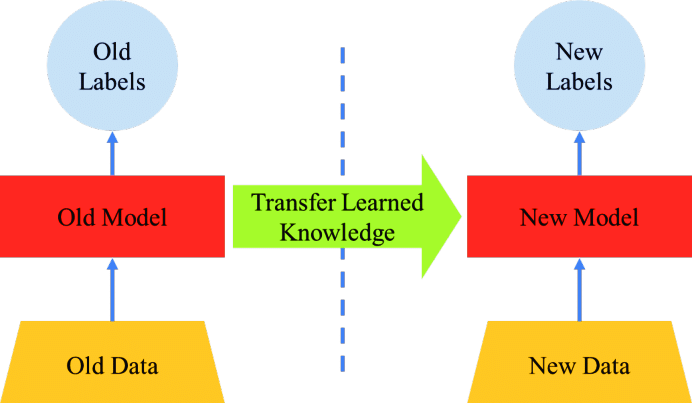

**Fine-tuning ConvNet**

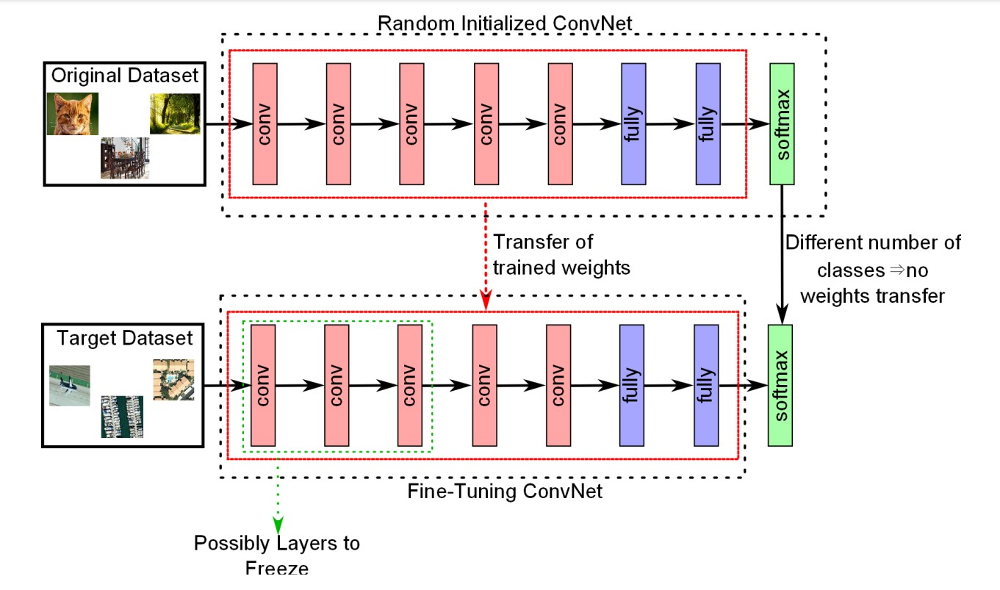

In fine-tuning we have a training dataset, that is trained with a certain neural network ($\text{Net}_a$), which will have its own weights. This network, will be capable of recognizing certain patterns or features according to the provided dataset of images.
Now, imagine that we have a new dataset (even small) that represents different images with respect to the above mentioned dataset, and you would like to transfer the knowledge of that neural network to this new dataset. This is called fine-tuning.

In fine-tuning, the weights of the trained $\text{Net}_a$, execept the ones of the last layer (the classifier), are transfered to a new $\text{Net}_b$, associated with the new dataset, the only thing that changes, is the last classifier layer of $\text{Net}_b$.

# **Fine-tuning AlexNet**

Let's mount google drive to put data in it:

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Let's download our [dataset](https://drive.google.com/file/d/0B81rNlvomiwed0V1YUxQdC1uOTg/view?usp=sharing&resourcekey=0-2SNWq0CDAuWOBRRBL7ZZsw) and copy it from gdrive to local drive, to make the data loading faster:

In [ ]:
#!mkdir dataset

#!cp "gdrive/MyDrive/datasets/OfficeHomeDataset_10072016.zip" dataset/

#!ls dataset

#!unzip dataset/OfficeHomeDataset_10072016.zip -d dataset

#!ls dataset

Output streaming troncato alle ultime 5000 righe.
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00051.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00052.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00053.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00054.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00055.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00056.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00057.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00058.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00059.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00060.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00061.jpg  
  inflating: dataset/OfficeHomeDataset_10072016/Product/Speaker/00062.jpg  
  inflating: dataset/OfficeHomeDataset

**AlexNet**

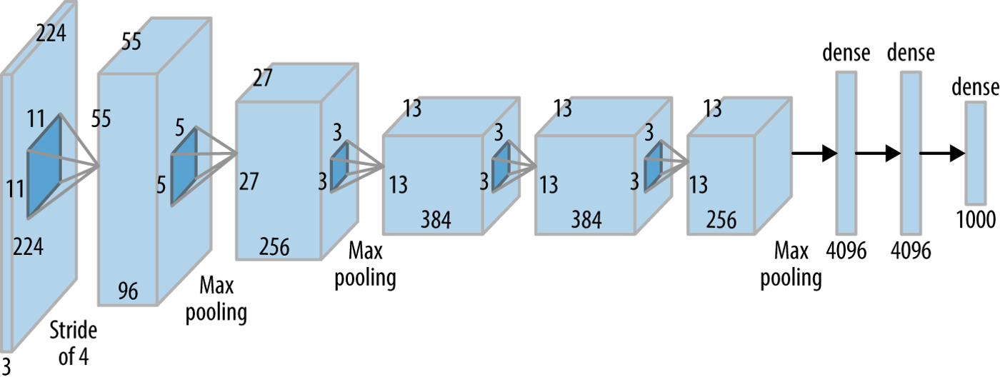

This is the network architecture of Alexnet. In this tutorial we are going to finetune a pre-trained Alexnet for classyfing Office-Home images. Alexnet has been pre-trained on ILSVRC-2021 dataset, a dataset that has more than **1 million** images with 1000 classes.

**A little bit about the Office-Home dataset**

Office Home has images from 4 different domains with each domain having 65 distinct categories. In this lab session we are going to use the *Real World* domain.

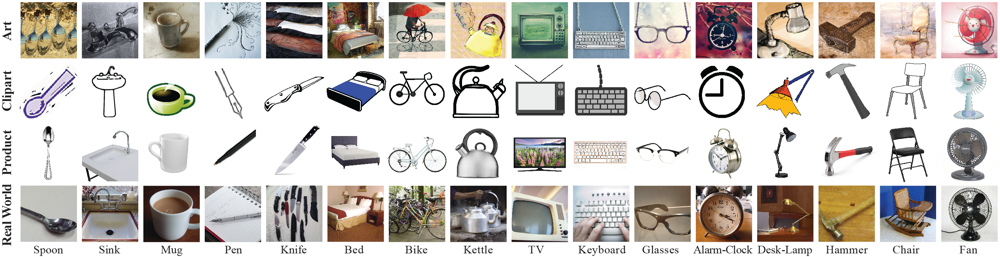

*Steps for fine-tuning Alexnet*

1. Discard the final layer (or the output layer) of Alexnet which contains 1000 output neurons.

2. Randomly initialize the final layer with the number of output categories present in the dataset using `torch.nn.Linear`. In this case it is 65, because OfficeHome has 65 classes. Keep all the other layer intact.

3. Train the network with a low learning rate for the pre-initialized layers and a higher learning rate for the newly initialize layer.

**How to load datasets from folders containing images**

PyTorch is kind enough to provide `torchvision.datasets.ImageFolder` for loading datasets from folders with just one line of code. But we need to ensure that the images in the folders are arranged in a certain way. A sample format is shown below:

**OfficeHomeDataset**:

```
|
|--- Alarm_Clock
|
|      |--- 00045.jpg
|      |--- 00050.jpg
|
|--- Couch
       |--- 00007.jpg
       |--- 00023.jpg
```

In other words, the parent folder (*OfficeHomeDataset*) contains the sub-folders (e.g. *Alarm_Clock, Couch). These sub-folders are the *classes*. Further, each sub-folder contains a bunch of images (eg. 00046.jpg, 00050.jpg for the class *Alarm_Clock*). Internally, PyTorch will assign a class label to each sub-folder and will also load the corresponding images.

In [ ]:
import torch, torchvision
import torch.nn.functional as F
import torchvision.transforms as T

from torch.utils.tensorboard import SummaryWriter
from torchsummary import summary

**Define DataLoader**

In [ ]:
def get_data(batch_size, img_root):

  transform = T.Compose([T.Resize((256, 256)),         # Resize each PIL image to 256x256
             T.RandomCrop((224, 224)),                 # Randomly crop a 224x224 patch
             T.ToTensor(),                             # Converts Numpy to PyTorch Tensor
             T.Normalize(mean=[0.485, 0.456, 0.406],   # Normalize with ImageNet mean
                         std=[0.229, 0.224, 0.225])])
  
  #Load data
  officehome_dataset = torchvision.datasets.ImageFolder(root=img_root, transform=transform)
  
  # Create train and test splits
  # We will create a 80-20 (train-test) split
  q_train = int(len(officehome_dataset) * 0.8)
  q_test = int(len(officehome_dataset) - q_train)

  training_data, test_data = torch.utils.data.random_split(officehome_dataset, [q_train, q_test])

  # Initialize dataloaders
  train_loader = torch.utils.data.DataLoader(training_data, batch_size, shuffle=True, num_workers=2)
  test_loader = torch.utils.data.DataLoader(test_data, batch_size, shuffle=False, num_workers=2)

  return train_loader, test_loader

**Define Alexnet model**

PyTorch provides a bunch of pre-trained models whose parameters have been learned on ImageNet dataset.

We will load a pre-trained Alexnet using PyTorch's `torchvision` package. Then we will re-initialize the output layer suited for our classification task. First, let's have a look at the [code](https://github.com/pytorch/vision/blob/main/torchvision/models/alexnet.py) of Alexnet:

Alexnet is made of the following `sequential` chunks:

- *features*: 
```
Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace=True)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1)
  (3): Conv2d(64, 192, kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU(inplace=True)
  (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False))
  ```

- *avgpool*:
```
AdaptiveAvgPool2d(output_size=(6, 6))
```

- *classifier*:

  ```
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=4096, out_features=4096, bias=True)
    (5): ReLU(inplace=True)
    (6): Linear(in_features=4096, out_features=1000, bias=True))
  ```

And, according to how we should perform Alexnet fine-tuning, we are supposed to discard the last layer of the classifier. We can do it as follows:

In [ ]:
from torchvision.models import AlexNet_Weights

def init_alexnet(num_classes):
  """
  num_classes: number of classes in the dataset.
               This is equal to the number of output neurons
  """
  # Load pre-trained Alexnet.
  # Notice that pretrained=True will be soon deprecated, that is why here "weights" is used instead
  alexnet = torchvision.models.alexnet(weights=AlexNet_Weights.IMAGENET1K_V1)

  # Get the number of neurons in the last layer
  in_features = alexnet.classifier[6].in_features

  # Re-initialize the output layer to adapt it to the current task
  alexnet.classifier[6] = torch.nn.Linear(in_features=in_features,
                                          out_features=num_classes)
  
  return alexnet

Visualize our custom Alexnet model

In [ ]:
# Since we have 65 classes in our dataset, we initialize it with 65
print(init_alexnet(num_classes=65))

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

# **Define the optimizer**

The **cost function* is going to be the same as the previous models. But the **optimizer** is going to be different:

previously the learning rate was static for all the layers of the networks. Now, we will have different learning rates for different layers. The pre-trained layers need to be updated at less rate than the newly initialized layers:

In [ ]:
def get_optimizer(model, lr, wd):
  # We will create two groups of weights, one for the newly initialized layer
  # and the other for rest of the layers of the network
  final_layer_weights = []
  rest_of_the_net_weights = []

  # We will iterate through the layers of the network
  for name, param in model.named_parameters():
    if name.startswith('classifier.6'):
      final_layer_weights.append(param)
    else:
      rest_of_the_net_weights.append(param)
  
  # Now we have divided the network weights into two groups.
  # We will train the final_layer_weights with learning_rate = lr
  # and the rest_of_the_net_weights with learning_rate = lr / 10
  optimizer = torch.optim.Adam([
      {'params': rest_of_the_net_weights},
      {'params': final_layer_weights, 'lr': lr}],
      lr=lr / 10, weight_decay=wd)
  
  return optimizer

To have an idea of the code, while iterating with `for name, param in model.named_parameters()`, we get:

```
(features.0.weight,torch.size([64, 3, 11, 11]))
(features.0.bias, torch.size([64]))
(features.3.weight, torch.size([192, 64, 5, 5]))
(features.3.bias, torch.size([192]))
(features.6.weight, torch.size([384, 192, 3, 3]))
(features.6.bias, torch.size([384]))
(features.8.weight, torch.size([256, 384, 3, 3]))
(features.8.bias, torch.size([256]))
(features.10.weight, torch.size([256, 256, 3, 3]))
(features.10.bias, torch.size([256]))
(classifier.1.weight, torch.size([4096, 9216]))
(classifier.1.bias, torch.size([4096]))
(classifier.4.weight, torch.size([4096, 4096]))
(classifier.4.bias, torch.size([4096]))
(classifier.6.weight, torch.size([64, 4096]))
(classifier.6.bias, torch.size([64]))
```

if `name.startswith('classifier.6')` we append its weights and biases into the list `final_layer_weights`. Otherwise, all the other layers' parameters go into the list `rest_of_the_net_weights = []`.
In this way, we can pass different parameters to our optimizer:
the parameters from `final_layer_weights` are going to use `lr` as a learning rate, while all the others are going to use `lr` / 10.


Note that in this case, while defining the train and test functions, is mandatory to define `net.train()` and `net.eval()`, since we are devising dropout.

In [ ]:
def log_values(writer, step, loss, accuracy, prefix):
  writer.add_scalar(f'{prefix}/loss', loss, step)
  writer.add_scalar(f'{prefix}/accuracy', accuracy, step)

def train_one_epoch(model, loader, optimizer, cost_function, e, kind, writer, device):
  samples = 0.
  cumulative_loss = 0.
  cumulative_accuracy = 0.

  model.train()
  for batch_size, (x, y) in enumerate(loader):
    x = x.to(device)
    y = y.to(device)

    out = model(x)

    loss = cost_function(out, y)

    loss.backward()

    optimizer.step()

    optimizer.zero_grad()

    samples += x.shape[0]
    cumulative_loss += loss.item()
    _, predicted = out.max(dim=1)
    cumulative_accuracy += predicted.eq(y).sum().item()
  
  log_values(writer, e, cumulative_loss, cumulative_accuracy/samples*100, kind)

  return cumulative_loss/samples, cumulative_accuracy/samples*100

In [ ]:
def test_one_epoch(model, loader, cost_function, e, kind, writer, device):
  samples = 0.
  cumulative_loss = 0.
  cumulative_accuracy = 0.

  model.eval()
  with torch.no_grad():
    for (x, y) in loader:
      x = x.to(device)
      y = y.to(device)

      out = model(x)

      loss = cost_function(out, y)

      samples += x.shape[0]
      cumulative_loss += loss.item()
      _, predicted = out.max(dim=1)
      cumulative_accuracy += predicted.eq(y).sum().item()
  
  log_values(writer, e, cumulative_loss, cumulative_accuracy/samples*100, kind)
  
  return cumulative_loss/samples, cumulative_accuracy/samples*100

In [ ]:
def run_model(total_epochs, device):

  model = init_alexnet(num_classes=65)
  model.to(device)

  optimizer = get_optimizer(model, lr=1e-3, wd=1e-6)

  cost_function = torch.nn.CrossEntropyLoss()

  train_loader, test_loader = get_data(batch_size=64, img_root="/content/dataset/OfficeHomeDataset_10072016/Real World")

  writer = SummaryWriter(log_dir='runs/exp1')

  print('Starting point:')
  train_loss, train_accuracy = test_one_epoch(model, train_loader, cost_function, -1, 'Train', writer, device=device)
  test_loss, test_accuracy = test_one_epoch(model, test_loader, cost_function, -1, 'Test', writer, device=device)
  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------\n\n')

  for e in range(1, total_epochs+1):
    train_loss, train_accuracy = train_one_epoch(model, train_loader, optimizer, cost_function, e, 'Train', writer, device=device)
    test_loss, test_accuracy = test_one_epoch(model, test_loader, cost_function, e, 'Test', writer, device=device)

    print('Epoch: {:d}'.format(e))
    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')

  # Compute final evaluation results
  print('Results:')
  train_loss, train_accuracy = test_one_epoch(model, train_loader, cost_function, e, 'Train', writer, device=device)
  test_loss, test_accuracy = test_one_epoch(model, test_loader, cost_function, e, 'Test', writer, device=device)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')

  # Close the logger
  writer.close()

In [ ]:
#!rm \runs -r

In [ ]:
run_model(total_epochs=10, device='cuda:0')

Starting point:
	 Training loss 0.06982, Training accuracy 2.24
	 Test loss 0.07091, Test accuracy 2.64
-----------------------------------------------------


Epoch: 1
	 Training loss 0.03186, Training accuracy 48.26
	 Test loss 0.02161, Test accuracy 62.50
-----------------------------------------------------
Epoch: 2
	 Training loss 0.01031, Training accuracy 80.60
	 Test loss 0.02008, Test accuracy 65.14
-----------------------------------------------------
Epoch: 3
	 Training loss 0.00484, Training accuracy 90.79
	 Test loss 0.02366, Test accuracy 64.33
-----------------------------------------------------
Epoch: 4
	 Training loss 0.00314, Training accuracy 93.66
	 Test loss 0.02357, Test accuracy 67.78
-----------------------------------------------------
Epoch: 5
	 Training loss 0.00239, Training accuracy 95.27
	 Test loss 0.02651, Test accuracy 65.37
-----------------------------------------------------
Epoch: 6
	 Training loss 0.00269, Training accuracy 95.15
	 Test loss 0.027

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Thanks to fine-tuning you can notice that we reached a good accuracy very early. Nonetheless, since we didn't devise a train-validation-test split, overfitting is an issue. Also, the final accuracy is not very high (~65%).